<a href="https://colab.research.google.com/github/daradaaryan/Animal-Binary-Classification-using-VGG/blob/main/Binary_Animal_Classifier_VGG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
import torchvision
from torchvision import datasets, transforms,models
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch

/usr/lib/python3/dist-packages/requests/__init__.py:89: RequestsDependencyWarning: urllib3 (1.26.12) or chardet (3.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


In [ ]:
def get_data(augument):
    data_dir = "dataset_ape_vs_snakes/"
    transform1 = transforms.Compose(
        [transforms.Resize((200, 200)),
         transforms.RandomRotation(degrees=25),
        transforms.RandomHorizontalFlip(), transforms.ToTensor()]
    )
    transform2=transforms.Compose([transforms.Resize((200,200)),transforms.ToTensor()])
    train_set_augument = datasets.ImageFolder(data_dir + "train", transform=transform1)
    train_set=datasets.ImageFolder(data_dir + "train", transform=transform2)
    test_set = datasets.ImageFolder(data_dir + "test", transform=transform2)
    training_augument=DataLoader(train_set_augument, batch_size=64, shuffle=True)
    training = DataLoader(train_set, batch_size=64, shuffle=True)
    testing = DataLoader(test_set, batch_size=64, shuffle=True)
    if(augument):
        return training_augument, testing
    return training, testing


In [ ]:
training,testing=get_data(0)

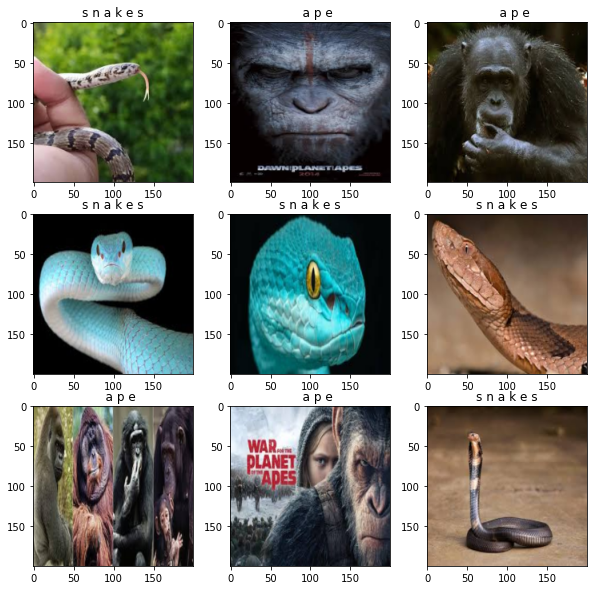

In [ ]:
def train_imshow():
    classes = ('ape', 'snakes') # Defining the classes we have
    dataiter = iter(training)
    images, labels = next(dataiter)
    fig, axes = plt.subplots(figsize=(10, 10), ncols=3,nrows=3)
    for i in range(3):
        for j in range(3):
            ax = axes[i][j]
            ax.imshow(images[i*3+j].permute(1, 2, 0)) 
            ax.title.set_text(' '.join('%5s' % classes[labels[i*3+j]]))
    return fig
#calle the function to show the images
a=train_imshow()
plt.show()

In [ ]:
class Net(nn.Module):
    def __init__(self):

        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3,padding='same')
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(320000, 128)
        self.fc2 = nn.Linear(128, 2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x=x.view(-1,320000)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
class Net2(nn.Module):
    def __init__(self):

        super(Net2, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3,padding='same')
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 3,padding='same')
        self.pool2 = nn.MaxPool2d(2, 2)
        self.conv3 = nn.Conv2d(64, 128, 3,padding='same')
        self.pool3 = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(80000, 128)
        self.fc2 = nn.Linear(128, 2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool2(F.relu(self.conv2(x)))
        x = self.pool3(F.relu(self.conv3(x)))
        x=x.view(-1,80000)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
class MLP(nn.Module):
    def __init__(self):

        super(MLP, self).__init__()
        self.Layer1 = nn.Linear(3*200*200, 1024)
        self.Layer2 = nn.Linear(1024, 512)
        self.Layer3 = nn.Linear(512, 256)
        self.Layer4 = nn.Linear(256, 128)
        self.Layer5 = nn.Linear(128, 64)
        self.Layer6 = nn.Linear(64, 32)
        self.Layer7 = nn.Linear(32, 16)
        self.Layer8 = nn.Linear(16, 2)

    def forward(self, x):
        x = x.view(-1, 3*200*200)
        x = F.leaky_relu(self.Layer1(x))
        x = F.leaky_relu(self.Layer2(x))
        x = F.leaky_relu(self.Layer3(x))
        x = F.leaky_relu(self.Layer4(x))
        x = F.leaky_relu(self.Layer5(x))
        x = F.leaky_relu(self.Layer6(x))
        x = F.leaky_relu(self.Layer7(x))
        x = F.leaky_relu(self.Layer8(x))
        return x

In [ ]:
model=models.vgg16(pretrained=True)
for param in model.parameters():
    param.requires_grad = False
n_inputs = model.classifier[6].in_features
model.classifier[6] = nn.Sequential(
            nn.Linear(n_inputs, 256), nn.ReLU(),
            nn.Linear(256, 2))

/home/sachin/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/sachin/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
VGG1=Net()
VGG3=Net2()
mlp=MLP()

In [ ]:
optimizer1=optim.Adam(VGG1.parameters(),lr=0.001)

In [ ]:
from torchsummary import summary
criteria = nn.CrossEntropyLoss()
optimizer1=optim.Adam(VGG1.parameters(),lr=0.001)
optimizer3=optim.Adam(VGG3.parameters(),lr=0.001)
optimizer4=optim.Adam(model.parameters(),lr=0.001)
summary(VGG1,(3,200,200))
summary(VGG3,(3,200,200))
summary(model,(3,200,200))
summary(mlp,(3,200,200))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 200, 200]             896
         MaxPool2d-2         [-1, 32, 100, 100]               0
            Linear-3                  [-1, 128]      40,960,128
            Linear-4                    [-1, 2]             258
Total params: 40,961,282
Trainable params: 40,961,282
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.46
Forward/backward pass size (MB): 12.21
Params size (MB): 156.25
Estimated Total Size (MB): 168.92
----------------------------------------------------------------
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 200, 200]             896
         MaxPool2d-2         [-1, 32, 100, 100]               0
            Conv2d-3         [

In [ ]:
def train_net(model,n_epoch,optimizer,training): # Training our network
    losses = []
    for epoch in range(n_epoch):  # loop over the dataset multiple times
        running_loss = 0.0
        for i, data in enumerate(training, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs =model.forward(inputs)
            # print(labels.size(),outputs.size())
            loss = criteria(outputs, labels)
            loss.backward()
            optimizer.step()

            # print statistics
            losses.append(loss.item())
            running_loss += loss.item()
            if i % 3 == 0:  # print every 2000 mini-batches
                print('[%d, %5d] loss: %.10f' %
                      (epoch + 1, i + 1, running_loss/1))
                running_loss = 0.0
    plt.plot(losses, label='Training loss')
    plt.show()
    print('Finished Training')

[1,     1] loss: 0.6981051564
[2,     1] loss: 23.2489299774
[3,     1] loss: 24.1626052856
[4,     1] loss: 9.4115524292
[5,     1] loss: 1.5844084024
[6,     1] loss: 8.0194911957
[7,     1] loss: 0.9628670216
[8,     1] loss: 2.0838921070
[9,     1] loss: 1.8158235550
[10,     1] loss: 3.5317692757
[11,     1] loss: 0.8612695932
[12,     1] loss: 0.9282579422
[13,     1] loss: 0.3130337894
[14,     1] loss: 0.5877135992
[15,     1] loss: 0.1859922707
[16,     1] loss: 0.2711068690
[17,     1] loss: 0.0845032707
[18,     1] loss: 0.0752678737
[19,     1] loss: 0.0096365074
[20,     1] loss: 0.0070883036
[21,     1] loss: 0.0239971466
[22,     1] loss: 0.0029258789
[23,     1] loss: 0.0019211555
[24,     1] loss: 0.0093517704
[25,     1] loss: 0.0038572066
[26,     1] loss: 0.0035346411
[27,     1] loss: 0.0016982874
[28,     1] loss: 0.0015691129
[29,     1] loss: 0.0020950327
[30,     1] loss: 0.0012552211
[31,     1] loss: 0.0012528165
[32,     1] loss: 0.0008504490
[33,     1] los

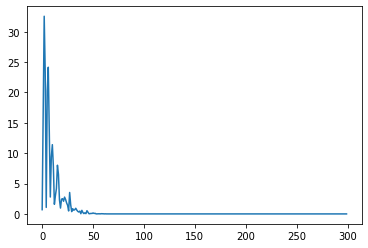

Finished Training


In [ ]:
#VGG1 
training,testing=get_data(0)
train_net(VGG1,100,optimizer1,training)

[1,     1] loss: 0.6938139796
[2,     1] loss: 0.6911514997
[3,     1] loss: 0.6457809806
[4,     1] loss: 0.5593510866
[5,     1] loss: 0.6734274626
[6,     1] loss: 0.4171426296
[7,     1] loss: 0.3666510284
[8,     1] loss: 0.3686406910
[9,     1] loss: 0.3683004379
[10,     1] loss: 0.2451155037
[11,     1] loss: 0.2556249499
[12,     1] loss: 0.2646341026
[13,     1] loss: 0.1859702766
[14,     1] loss: 0.2430708557
[15,     1] loss: 0.2295963466
[16,     1] loss: 0.0848168805
[17,     1] loss: 0.1294478029
[18,     1] loss: 0.0737584159
[19,     1] loss: 0.1800396889
[20,     1] loss: 0.0866273195
[21,     1] loss: 0.0595953166
[22,     1] loss: 0.0458172187
[23,     1] loss: 0.0555194765
[24,     1] loss: 0.0298509672
[25,     1] loss: 0.0635230169
[26,     1] loss: 0.0478802919
[27,     1] loss: 0.0942026302
[28,     1] loss: 0.0309701860
[29,     1] loss: 0.0280871596
[30,     1] loss: 0.0228797644


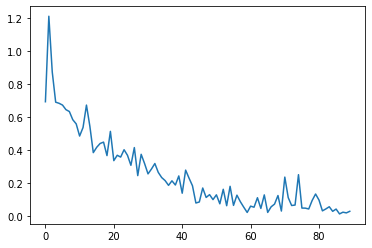

Finished Training


In [ ]:
#VGG3 with no data augumentation
training,testing=get_data(0)
VGG3=Net2()
optimizer3=optim.Adam(VGG3.parameters(),lr=0.001)
train_net(VGG3,30,optimizer3,training)

[1,     1] loss: 0.7042284608
[2,     1] loss: 0.6932309270
[3,     1] loss: 0.6940050125
[4,     1] loss: 0.6875768304
[5,     1] loss: 0.6725734472
[6,     1] loss: 0.6744055748
[7,     1] loss: 0.6865520477
[8,     1] loss: 0.6588861942
[9,     1] loss: 0.6301254034
[10,     1] loss: 0.5717002749
[11,     1] loss: 0.5712949634
[12,     1] loss: 0.5384473801
[13,     1] loss: 0.4806832969
[14,     1] loss: 0.4161461890
[15,     1] loss: 0.4533068240
[16,     1] loss: 0.5518494844
[17,     1] loss: 0.4256246090
[18,     1] loss: 0.4896457195
[19,     1] loss: 0.3880210519
[20,     1] loss: 0.3262754679
[21,     1] loss: 0.2450112998
[22,     1] loss: 0.3461098969
[23,     1] loss: 0.3172686696
[24,     1] loss: 0.3470868170
[25,     1] loss: 0.3563441038
[26,     1] loss: 0.3002793193
[27,     1] loss: 0.2561920583
[28,     1] loss: 0.3450865448
[29,     1] loss: 0.2851870358
[30,     1] loss: 0.4804604053
[31,     1] loss: 0.3017889559
[32,     1] loss: 0.1955528855
[33,     1] loss:

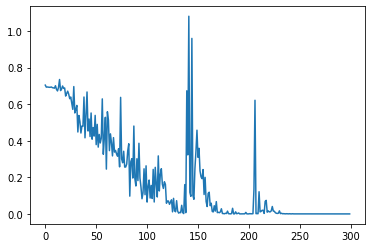

Finished Training


In [ ]:
training,testing=get_data(0)
mlp=MLP()
optimizer3=optim.Adam(mlp.parameters(),lr=0.001)
train_net(mlp,100,optimizer3,training)

[1,     1] loss: 0.6806821227
[2,     1] loss: 0.6999340057
[3,     1] loss: 0.6889881492
[4,     1] loss: 0.6765999198
[5,     1] loss: 0.6479338408
[6,     1] loss: 0.5709944963
[7,     1] loss: 0.5076851249
[8,     1] loss: 0.4281626344
[9,     1] loss: 0.5163601041
[10,     1] loss: 0.5925746560
[11,     1] loss: 0.4793687165
[12,     1] loss: 0.4598264098
[13,     1] loss: 0.4836703241
[14,     1] loss: 0.4378184676
[15,     1] loss: 0.4167843163
[16,     1] loss: 0.3565867245
[17,     1] loss: 0.3546316028
[18,     1] loss: 0.3188907802
[19,     1] loss: 0.2829799652
[20,     1] loss: 0.2459322512
[21,     1] loss: 0.3036731482
[22,     1] loss: 0.3086718023
[23,     1] loss: 0.4667164683
[24,     1] loss: 0.2506003380
[25,     1] loss: 0.3548143506
[26,     1] loss: 0.2688064575
[27,     1] loss: 0.2415529042
[28,     1] loss: 0.2522537112
[29,     1] loss: 0.1916784346
[30,     1] loss: 0.1951344162


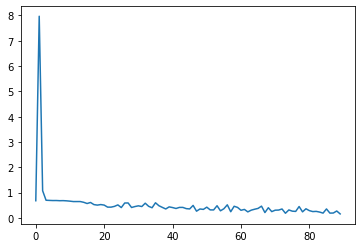

Finished Training


In [ ]:
#VGG3 with Data Augumentation
training,testing=get_data(1)
VGG3_aug=Net2()
optimizer3=optim.Adam(VGG3_aug.parameters(),lr=0.001)
train_net(VGG3_aug,30,optimizer3,training)

[1,     1] loss: 0.0000646458
[2,     1] loss: 0.0000313190
[3,     1] loss: 0.0000455150
[4,     1] loss: 0.0000433118
[5,     1] loss: 0.0000058314
[6,     1] loss: 0.0000228155
[7,     1] loss: 0.0000066939
[8,     1] loss: 0.0000858168
[9,     1] loss: 0.0000109752
[10,     1] loss: 0.0001316799
[11,     1] loss: 0.0005823426
[12,     1] loss: 0.0000907435
[13,     1] loss: 0.0000052576
[14,     1] loss: 0.0002309890
[15,     1] loss: 0.0000154831
[16,     1] loss: 0.0000206477
[17,     1] loss: 0.0000007003
[18,     1] loss: 0.0003727784
[19,     1] loss: 0.0000023878
[20,     1] loss: 0.0000111466


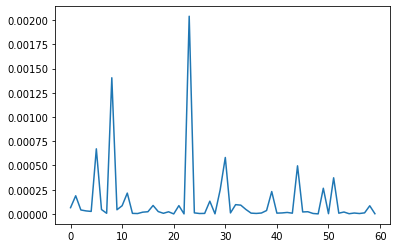

Finished Training


In [ ]:
training,testing=get_data(0)
train_net(model,20,optimizer4,training)

In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in testing:
        images, labels = data
        outputs = VGG1(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the VGG1 on test images: %d %%' % ( 100 * correct / total))

Accuracy of the VGG1 on test images: 80 %


In [ ]:
correct = 0
total = 0
training,testing=get_data(0)
with torch.no_grad():
    for data in training:
        images, labels = data
        outputs = VGG1(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the VGG1 on training images: %d %%' % (100 * correct / total))

Accuracy of the VGG1 on training images: 100 %


In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in testing:
        images, labels = data
        outputs = VGG3(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the VGG3 with no augumentation on testing images: %d %%' % (100 * correct / total))

Accuracy of the VGG3 with no augumentation on testing images: 85 %


In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in training:
        images, labels = data
        outputs = VGG3(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of VGG3 on training images: %d %%' % (100 * correct / total))

Accuracy of VGG3 on training images: 100 %


In [ ]:
#VGG3 with data augumentation
correct = 0
total = 0
with torch.no_grad():
    for data in testing:
        images, labels = data
        outputs = VGG3_aug(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of VGG3 with augumentation on testing images: %d %%' % (100 * correct / total))

Accuracy of VGG3 with augumentation on testing images: 75 %


In [ ]:
correct = 0
total = 0
training,testing=get_data(1)
with torch.no_grad():
    for data in training:
        images, labels = data
        outputs = VGG3_aug(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of VGG3 with augumentation on training images: %d %%' % (100 * correct / total))

Accuracy of VGG3 with augumentation on training images: 91 %


In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in testing:
        images, labels = data
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of VGG16 on testing images: %d %%' % (100 * correct / total))

Accuracy of VGG16 on testing images: 95 %


In [ ]:
correct = 0
total = 0
training,testing=get_data(0)
with torch.no_grad():
    for data in training:
        images, labels = data
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
print('Accuracy of VGG16 on training images: %d %%' % (100 * correct / total))

Accuracy of VGG16 on training images: 100 %


In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in testing:
        images, labels = data
        outputs = mlp(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of MLP on testing images: %d %%' % (100 * correct / total))

Accuracy of MLP on testing images: 75 %


In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in training:
        images, labels = data
        outputs = mlp(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of MLP on training images: %d %%' % (100 * correct / total))

Accuracy of MLP on training images: 100 %


| Model | Training Time | Training Loss(30 epoch) | Testing Accuracy | Training Accuracy | Number of Params
| --- | --- | --- | --- | --- | --- |
| VGG1 | 2.67 sec/epoch | 0.0075 | 80% | 100% | 40,961,282
| VGG3 | 4.33 sec/epoch | 0.0230 | 85% | 100% | 10,333,634
| VGG3(DA) | 4.33 sec/epoch | 0.195 | 75% | 91% | 10,333,634
| VGG16 | 14 sec/epoch | 0.00001 | 95% | 100% | 135,309,890(Learnt-1,049,346)
| MLP | 2.67 sec/epoch | 0.5 | 65% | 91% | 123,580,946
| MLP(100 epoch) | 2.67 sec/epoch | 0.00001 | 75% | 100% | 123,580,946

In [ ]:
from torch.utils.tensorboard import SummaryWriter

In [ ]:
writer=SummaryWriter(f'runs/tryingout_tensorboard/answers')

In [ ]:
def train_net(model,n_epoch,optimizer,training,model_no=0): # Training our network
    losses = []
    step=0
    correct = 0
    total = 0
    for epoch in range(n_epoch):  # loop over the dataset multiple times
        running_loss = 0.0
        for i, data in enumerate(training, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs =model.forward(inputs)
            # print(labels.size(),outputs.size())
            loss = criteria(outputs, labels)
            loss.backward()
            optimizer.step()
                # for data in training:
            images, labels = data
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            writer.add_scalar(f'TrainingLossmodel{model_no}',loss,global_step=step)
            # writer.add_scalar('TestingLossVGG1',running_testing_loss,global_step=step)
            
            # print statistics
            losses.append(loss.item())
            running_loss += loss.item()
    #         print('Accuracy of the network on the %d training images: %d %%' % (len(training),
    # 100 * correct / total))
            running_training_accuracy=100 * correct / total
            writer.add_scalar(f'TrainingAccuracy{model_no}',running_training_accuracy,global_step=step)
            if i % 1 == 0:  # print every 2000 mini-batches
                print('[%d, %5d] loss: %.10f' %
                      (epoch + 1, i + 1, running_loss/1))
                running_loss = 0.0
            for data in testing:
                images, labels = data
                outputs = model(images)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
            running_testing_accuracy=100 * correct / total
            writer.add_scalar(f'TestingAccuracy{model_no}',running_testing_accuracy,global_step=step)
            step+=1
    plt.plot(losses, label='Training loss')
    plt.show()
    print('Finished Training')

[1,     1] loss: 0.6928361654
[1,     2] loss: 1.2841029167
[1,     3] loss: 1.1089520454
[2,     1] loss: 0.7699747682
[2,     2] loss: 0.7212298512
[2,     3] loss: 0.6894667149
[3,     1] loss: 0.6958823800
[3,     2] loss: 0.6615033150
[3,     3] loss: 0.6376347542
[4,     1] loss: 0.6337102056
[4,     2] loss: 0.6182100773
[4,     3] loss: 0.6956602931
[5,     1] loss: 0.5430417061
[5,     2] loss: 0.5507240891
[5,     3] loss: 0.4800799787
[6,     1] loss: 0.4954419434
[6,     2] loss: 0.5882749557
[6,     3] loss: 0.4800582230
[7,     1] loss: 0.6091543436
[7,     2] loss: 0.5103750825
[7,     3] loss: 0.3620732427
[8,     1] loss: 0.5082269907
[8,     2] loss: 0.3230488002
[8,     3] loss: 0.5731137991
[9,     1] loss: 0.4776330590
[9,     2] loss: 0.3891725242
[9,     3] loss: 0.4622580707
[10,     1] loss: 0.4175532460
[10,     2] loss: 0.3575350344
[10,     3] loss: 0.4262153208
[11,     1] loss: 0.4097412527
[11,     2] loss: 0.3646117747
[11,     3] loss: 0.4235628545
[12,

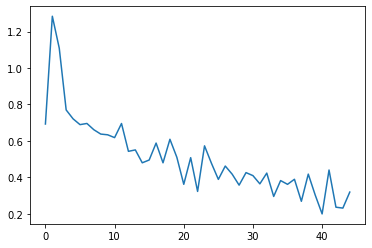

Finished Training


In [ ]:
training,testing=get_data(0)
VGG3=Net2()
optimizer3=optim.Adam(VGG3.parameters(),lr=0.001)
train_net(VGG3,15,optimizer3,training,model_no=1)

[1,     1] loss: 0.6929582953
[1,     2] loss: 0.6978328824
[1,     3] loss: 0.6865466237
[2,     1] loss: 0.7006076574
[2,     2] loss: 0.6878275871
[2,     3] loss: 0.6912583709
[3,     1] loss: 0.6902356744
[3,     2] loss: 0.6983553171
[3,     3] loss: 0.6909467578
[4,     1] loss: 0.6901352406
[4,     2] loss: 0.6943005323
[4,     3] loss: 0.6992571950
[5,     1] loss: 0.6928630471
[5,     2] loss: 0.6934642792
[5,     3] loss: 0.6954739690
[6,     1] loss: 0.6947225928
[6,     2] loss: 0.6882665157
[6,     3] loss: 0.7021506429
[7,     1] loss: 0.6911029220
[7,     2] loss: 0.6939153075
[7,     3] loss: 0.6980922222
[8,     1] loss: 0.6927233934
[8,     2] loss: 0.6963697076
[8,     3] loss: 0.6899424195
[9,     1] loss: 0.6885673404
[9,     2] loss: 0.6985509396
[9,     3] loss: 0.6938920617
[10,     1] loss: 0.6950167418
[10,     2] loss: 0.6950651407
[10,     3] loss: 0.6879649162
[11,     1] loss: 0.6901190877
[11,     2] loss: 0.6934983730
[11,     3] loss: 0.7008938789
[12,

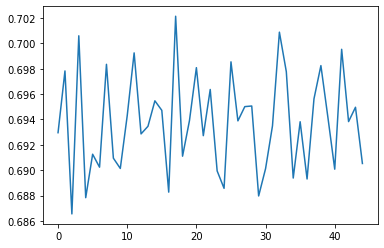

Finished Training


In [ ]:
training,testing=get_data(0)
VGG1=Net()
optimizer3=optim.Adam(VGG1.parameters(),lr=0.001)
train_net(VGG1,15,optimizer1,training,model_no=2)

In [ ]:
model=models.vgg16(pretrained=True)
for param in model.parameters():
    param.requires_grad = False
n_inputs = model.classifier[6].in_features
model.classifier[6] = nn.Sequential(
            nn.Linear(n_inputs, 256), nn.ReLU(),
            nn.Linear(256, 2))

/home/sachin/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/sachin/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[1,     1] loss: 0.7257101536
[1,     2] loss: 0.3312513232
[1,     3] loss: 0.0771067366
[2,     1] loss: 0.0700459629
[2,     2] loss: 0.0167367607
[2,     3] loss: 0.0499380305
[3,     1] loss: 0.0077287280
[3,     2] loss: 0.0066603897
[3,     3] loss: 0.1813711822
[4,     1] loss: 0.0887815356
[4,     2] loss: 0.0004593267
[4,     3] loss: 0.0009554407
[5,     1] loss: 0.0056223329
[5,     2] loss: 0.0001675950
[5,     3] loss: 0.0000402073
[6,     1] loss: 0.0051579946
[6,     2] loss: 0.0009813259
[6,     3] loss: 0.0001075377
[7,     1] loss: 0.0007455719
[7,     2] loss: 0.0011613464
[7,     3] loss: 0.0017920907
[8,     1] loss: 0.0012497246
[8,     2] loss: 0.0019646210
[8,     3] loss: 0.0011812093
[9,     1] loss: 0.0067346944
[9,     2] loss: 0.0012852723
[9,     3] loss: 0.0000048987
[10,     1] loss: 0.0039727702
[10,     2] loss: 0.0000999212
[10,     3] loss: 0.0001285752
[11,     1] loss: 0.0000375742
[11,     2] loss: 0.0001215064
[11,     3] loss: 0.0001768288
[12,

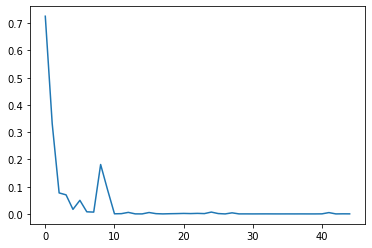

Finished Training


In [ ]:
training,testing=get_data(0)
# VGG3=Net2()
optimizer4=optim.Adam(model.parameters(),lr=0.001)
train_net(model,15,optimizer4,training,model_no=3)

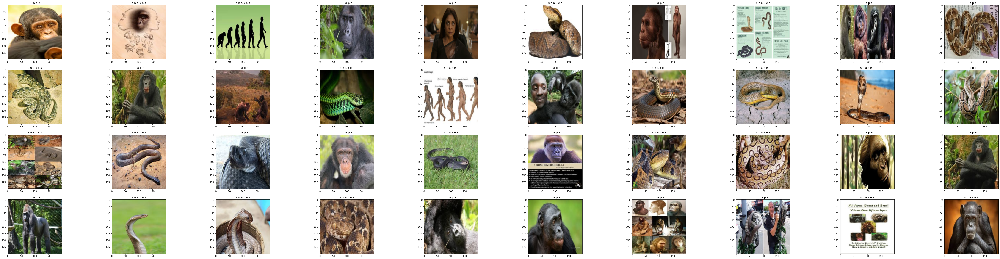

In [ ]:
def test_imshow_VGG1():
    classes = ('ape', 'snakes') # Defining the classes we have
    dataiter = iter(testing)
    images,labels2 = next(dataiter)
    outputs = VGG1(images)
    _, labels = torch.max(outputs.data, 1)
    fig, axes = plt.subplots(figsize=(80, 20), ncols=10,nrows=4)
    for i in range(4):
        for j in range(10):
            ax = axes[i][j]
            ax.imshow(images[i*10+j].permute(1, 2, 0)) 
            ax.title.set_text(' '.join('%5s' % classes[labels[i*10+j]]))
    return fig
#calle the function to show the images
a=test_imshow_VGG1()
plt.show()

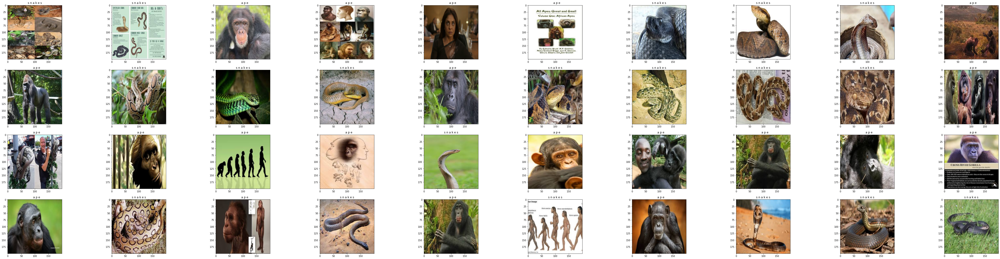

In [ ]:
def test_imshow():
    classes = ('ape', 'snakes') # Defining the classes we have
    dataiter = iter(testing)
    images,labels2 = next(dataiter)
    outputs = model(images)
    _, labels = torch.max(outputs.data, 1)
    fig, axes = plt.subplots(figsize=(80, 20), ncols=10,nrows=4)
    for i in range(4):
        for j in range(10):
            ax = axes[i][j]
            ax.imshow(images[i*10+j].permute(1, 2, 0)) 
            ax.title.set_text(' '.join('%5s' % classes[labels[i*10+j]]))
    return fig
#calle the function to show the images
a=test_imshow()
plt.show()

In [ ]:
writer.add_figure('data',a)
writer.close()

### Are the results expected? why or why not?
Filters preserve the property of translation invariance of the image hence the results as shown in the table are expected because VGG1 model has only one layer of convolution, one layer of maxpool and 2 linear fully connected component. Though the model has large amount of parameters but because of single layer of convolution the model did not performed as well as VGG 3 block, VGG16 model. having only single convolution layer of size 3x3 would only train a filter of size 3x3 which will convolve over 200x200 pixels hence this single filter would not be able to extract many features from the image. Similarly VGG3 has 3 convolution layer with RELU activation hence the filters would be able to extract more amount of features from the training set hence the VGG3 provides greater accuracy than the VGG1 block. VGG16 is a very Deep CNN it has multiple layers of convolution layers also it has multiple linear layers which provides more non-linearity and hence it is able to extract various types of data like color, shape from the image due to various filters.
### Does data augmentation help? Why or why not?
In the model implemented above Data Augumentation did not help, instead upon applying Data Augumentation on the VGG 3 block model the training and testing accuracy decreased upon training on the same number of epochs. The data augumentation did not help because 
* the number of training examples are less hence the augumentation applied to the data made the model to train.
* the testing images were all stright and perfectly matched the type of images on training set hence applying augumentation  on training set would decrease the accuracy, but in real world we have all kind of variation in training data and we also does not know the training data, hence augumentation would help for complex models with more data points.
* the VGG 3 only has 3 fiters hence it was not able to learn all the variable features present in the training data, when no augumentation all images were perfectly horizontal and was not normalised which matched with the testing data hence augumenting did not work
### Does it matter how many epochs you fine tune the model? Why or why not?
It does not matter how many epochs we fine tune our model after a certain point because after few epochs the training loss becomes nearly zero hence training it for more epochs would reduce the loss by very little amount and the model has already overfitted the training data hence further increasing would not affect the testing or training accuracy.
For models like VGG 1 block the training loss saturated to a value and did not decrease after that no matter how many epochs were applied.
### Are there any particular images that the model is confused about? Why or why not?
VGG 1 block was confused about few images like image of ape with green background, outline of ape with stone color background as snake. These misclassifications occur because VGG 1 block only uses a single filter hence it is unable to capture all types of various features. The model also misclassified few images of snakes as ape, because the image mostly contained the body of the snake of ape color hence the model misclassified as ape. The VGG 16 performed well on test data it misclassified almost no image because it has many filters hence many features.
### Conclusion when MLP used instead of CNN
When MLP used instead of CNN with the same number of parameters as VGG16, the model performed poorely than VGG 1 block model. It got an accuracy of 65% hence MLPs are not that effective for image classifcation. MLPs comress the input of size 200x200x3 into 1024 size in a single layer. Thus large amount of information is being crunched in a single non layer of network due to which the model is not effectively trained. MLP does not achieve the large amount of feature extraction as observed while training CNNs. CNNs use Convolution hence the filters are trained which extract more amount of feature of image. MLP are not **translation invariant** hence the correlation between various positions of the image is not extracted by MLPs which are effectively extracted by CNNs due to use of filters.

In [ ]:
!rm -rf runs/